In [1]:
import os
import json
import numpy as np
from PIL import Image, ImageFont, ImageDraw, ImageEnhance

In [2]:
# Path to the folder containing the images
coco_path = "./data/task_wlt_350_210926_p_2111131_wlt_350_210926__020 p_2111131.jpg-2023_02_10_07_43_07-coco 1.0/"
annotations_path = coco_path + "annotations/"
images_path = coco_path + "images/"

instances_default = json.loads(open(annotations_path + "instances_default.json").read())
images = instances_default["images"]
annotations = instances_default["annotations"]
categories = instances_default["categories"]

In [3]:
images[10]

{'id': 11,
 'width': 1562,
 'height': 1207,
 'file_name': 'WLT_350_210926 P_2111131 WLT_350_210926__014 P_2111131.JPG',
 'license': 0,
 'flickr_url': '',
 'coco_url': '',
 'date_captured': 0}

In [4]:
# annotations
# https://opencv.org/introduction-to-the-coco-dataset/
# “annotations”: {
#     “id”: int,
#     “image_id: int”,
#     “category_id”: int
#     “segmentation”: RLE or [polygon],
#     “area”: float,
#     “bbox”: [x,y,width,height],
#     “iscrowd”: 0 or 1
# }

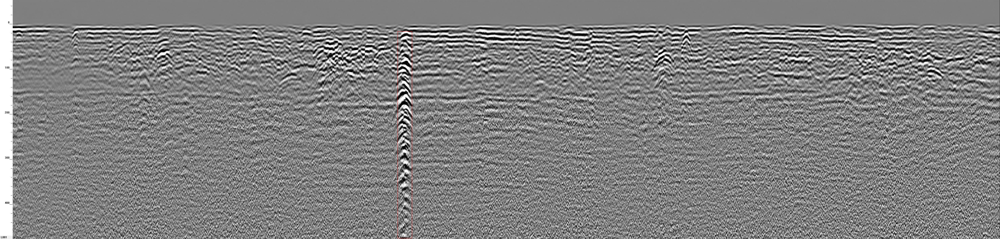

In [6]:
# use PIL to draw the bounding boxes on a sample image
img = Image.open(images_path + images[1]["file_name"])
draw = ImageDraw.Draw(img)
for annotation in annotations:
    if annotation["image_id"] != images[1]["id"]:
        continue
    bbox = [annotation["bbox"][0], annotation["bbox"][1], annotation["bbox"][0] + annotation["bbox"][2], annotation["bbox"][1] + annotation["bbox"][3]]
    draw.rectangle(bbox, outline="red")
img

In [18]:
def convert_coco_bbox_to_pil_bbox(coco_bbox):
    # coco_bbox: [x, y, width, height]
    # pil_bbox: [x, y, x + width, y + height]
    return [coco_bbox[0], coco_bbox[1], coco_bbox[0] + coco_bbox[2], coco_bbox[1] + coco_bbox[3]]

In [19]:
def calculate_iou(bb1, bb2):
    # determine the coordinates of the intersection rectangle
    x_left = max(bb1['x1'], bb2['x1'])
    y_top = max(bb1['y1'], bb2['y1'])
    x_right = min(bb1['x2'], bb2['x2'])
    y_bottom = min(bb1['y2'], bb2['y2'])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    # The intersection of two axis-aligned bounding boxes is always an
    # axis-aligned bounding box
    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    # compute the area of both AABBs
    bb1_area = (bb1['x2'] - bb1['x1']) * (bb1['y2'] - bb1['y1'])
    bb2_area = (bb2['x2'] - bb2['x1']) * (bb2['y2'] - bb2['y1'])

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    return iou


In [20]:
def calculate_intersection_percentage(bb1, bb2):
    # determine the coordinates of the intersection rectangle
    x_left = max(bb1['x1'], bb2['x1'])
    y_top = max(bb1['y1'], bb2['y1'])
    x_right = min(bb1['x2'], bb2['x2'])
    y_bottom = min(bb1['y2'], bb2['y2'])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    # The intersection of two axis-aligned bounding boxes is always an
    # axis-aligned bounding box
    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    # compute the area of both AABBs
    bb1_area = (bb1['x2'] - bb1['x1']) * (bb1['y2'] - bb1['y1'])
    
    # compute the intersection ratio by taking the intersection area and dividing it by the area of the first bounding box
    intersection_ratio = intersection_area / float(bb1_area)
    return intersection_ratio

In [21]:
# calculate the average bounding box shape
bbox_shapes = []
for annotation in annotations:
    anno_width, anno_height  = annotation["bbox"][2], annotation["bbox"][3]
    bbox_shapes.append([anno_width, anno_height])

bbox_shapes = np.array(bbox_shapes)
print(bbox_shapes.mean(axis=0)), print(bbox_shapes.std(axis=0)), print(bbox_shapes.max(axis=0)), print(bbox_shapes.min(axis=0))

[109.67746835 199.51088608]
[ 71.30564264 155.2470321 ]
[ 405.81 1044.32]
[40.97 55.18]


(None, None, None, None)

In [12]:
height

[1207,
 1207,
 1207,
 1207,
 1207,
 1207,
 1207,
 1207,
 1207,
 1207,
 1207,
 1207,
 1207,
 1207,
 1207,
 1207,
 1207,
 1207,
 1207]

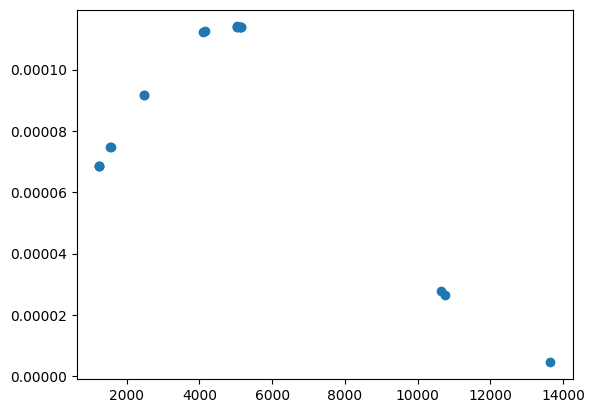

In [13]:
import statistics
from scipy.stats import norm
import matplotlib.pyplot as plt
  
# Plot between -10 and 10 with .001 steps.
x_axis = [i["width"] for i in images]
  
# Calculating mean and standard deviation
mean = statistics.mean(x_axis)
sd = statistics.stdev(x_axis)
  
plt.plot(x_axis, norm.pdf(x_axis, mean, sd), "o")

plt.show()

In [22]:
import tqdm

In [27]:
# standardise the images
size = 200
new_images = []
new_annotations = []
# cut the images into smaller images
standardised_images_path = "standardised_images_2/" + coco_path
os.makedirs(standardised_images_path, exist_ok=True)

for img in tqdm.tqdm_notebook(images):
    image_dimensions = img["width"], img["height"]
    image = Image.open(images_path + img["file_name"])
    concerned_annotations = [annotation for annotation in annotations if annotation["image_id"] == img["id"]]
    for y_pointer in range(0, image_dimensions[1], 10):
        for x_pointer in range(0, image_dimensions[0], 10):
            # dimensions in (left, upper, right, lower) format
            new_image_dimensions = (x_pointer, y_pointer, x_pointer+size, y_pointer+size)
            new_image = image.crop(new_image_dimensions)
            new_image.save(standardised_images_path + img["file_name"] + "_" + str(x_pointer) + "_" + str(y_pointer) + ".jpg")
            new_image_info = {
                "id": f"{img['id']}.{x_pointer}.{y_pointer}",
                "file_name": img["file_name"] + "_" + str(x_pointer) + "_" + str(y_pointer) + ".jpg",
                "width": size,
                "height": size,
                "old_id": img["id"]
            }
            new_images.append(new_image_info)
            for annotation in concerned_annotations:
                annotation_bbox = convert_coco_bbox_to_pil_bbox(annotation["bbox"])
                resultant_intersection_percentage = calculate_intersection_percentage({"x1": annotation_bbox[0], "y1": annotation_bbox[1],
                                                "x2": annotation_bbox[2], "y2": annotation_bbox[3]},
                                               {"x1": x_pointer, "y1": y_pointer, "x2": x_pointer + size, "y2": y_pointer + size})
                if resultant_intersection_percentage > 0.9:
                    new_annotation = {
                            "id": f"{annotation['id']}.{x_pointer}.{y_pointer}",
                            "image_id": new_image_info["id"],
                            "old_image_id": annotation["image_id"],
                            "category_id": annotation["category_id"],
                            "bbox": [annotation_bbox[0] - x_pointer, annotation_bbox[1] - y_pointer,
                                      annotation_bbox[2] - annotation_bbox[0], annotation_bbox[3] - annotation_bbox[1]],
                            "area": annotation["area"],
                            "iscrowd": annotation["iscrowd"],
                            "inter_percentage": resultant_intersection_percentage,
                            }
                    new_annotations.append(new_annotation)    

/var/folders/3g/7ms_vj7j6_j7lqgccpzbsslw0000gn/T/ipykernel_94662/1444096420.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for img in tqdm.tqdm_notebook(images):


  0%|          | 0/19 [00:00<?, ?it/s]

In [29]:
instances_default = json.loads(open(annotations_path + "instances_default.json").read())
instances_default_new = {}
instances_default_new["images"] = new_images
instances_default_new["annotations"] = new_annotations
instances_default_new["categories"] = instances_default["categories"]

json.dump(instances_default_new, open("./standardised_images_2/" + "instances_default_new.json", "w"))

In [28]:
standardised_images_path

'standardised_images_2/./data/task_wlt_350_210926_p_2111131_wlt_350_210926__020 p_2111131.jpg-2023_02_10_07_43_07-coco 1.0/'

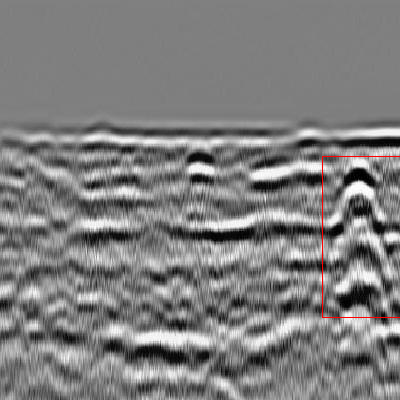

In [135]:
# use PIL to draw the bounding boxes on a sample image
img_new = Image.open(standardised_images_path + new_images[8271]["file_name"])
draw = ImageDraw.Draw(img_new)
for annotation in new_annotations:
    if annotation["image_id"] != new_images[8271]["id"]:
        continue
    bbox = [annotation["bbox"][0], annotation["bbox"][1], annotation["bbox"][0] + annotation["bbox"][2], annotation["bbox"][1] + annotation["bbox"][3]]
    draw.rectangle(bbox, outline="red")
img_new

In [140]:
len(os.listdir(standardised_images_path))
len(new_annotations)

1764

In [39]:
# # resize the images to a standard size of 200x200
# # resize the bounding boxes to the new image size
# # save the new images and annotations
# # save the new images and annotations
# for image in images:
#     img = Image.open(images_path + image["file_name"])
#     img = img.resize((200, 200), Image.ANTIALIAS)
#     img.save(images_path + image["file_name"])
#     for annotation in annotations:
#         if annotation["image_id"] != image["id"]:
#             continue
#         annotation["bbox"] = convert_coco_bbox_to_pil_bbox(annotation["bbox"])
#         annotation["bbox"][0] = annotation["bbox"][0] * 200 / image["width"]
#         annotation["bbox"][1] = annotation["bbox"][1] * 200 / image["height"]
#         annotation["bbox"][2] = annotation["bbox"][2] * 200 / image["width"]
#         annotation["bbox"][3] = annotation["bbox"][3] * 200 / image["height"]
#         annotation["bbox"] = convert_coco_bbox_to_coco_bbox(annotation["bbox"])
#         image["width"] = 200
#         image["height"] = 200
        


[757.4, 190.35, 220.07, 284.88]

In [52]:
# find the shape of the image in pillow
pixels = img.load()

In [57]:
img.size    

(1562, 1207)

In [68]:
image_array = np.asarray(img)

In [74]:
image_array[0:5].shape

(5, 1562, 3)

In [71]:
image_array.shape

(1207, 1562, 3)